# Single Side Band Modulation: Weaver's Method

In [1]:
%matplotlib notebook
import numpy as np
import scipy.signal as sp
import matplotlib.pyplot as plt
import arlpy.uwapm as pm
import arlpy.plot as arlpy_plt
import struct
import scipy.io.wavfile as wav

Parameters

In [2]:
B = 3300 #max frequency in message
fc = 32000 #carrier frequency
f0 = B/2 
f1 = fc - B/2 
fs = 96000 # sampling frequency

<IPython.core.display.Javascript object>


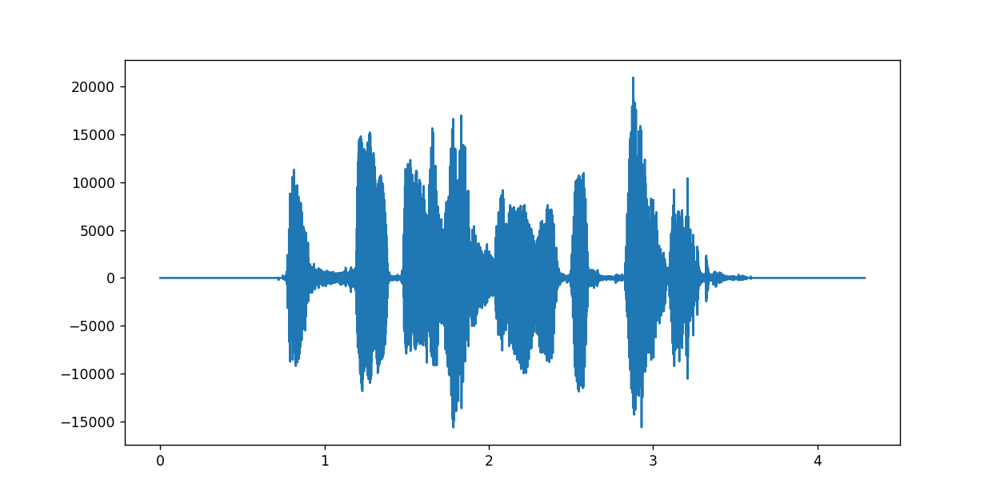

<IPython.core.display.Javascript object>


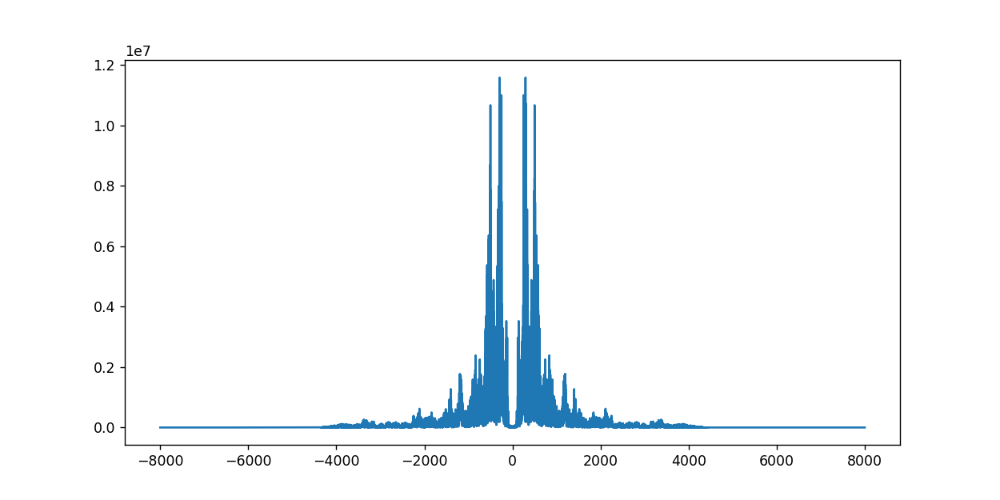

In [6]:
# Reading audio From WAV file
src_audio = 'd:\\UWA Project\\sample_input_16khz.wav'
fs_src, ms_src = wav.read(src_audio)
ms = ms_src
#ms = sp.resample(ms_src, int(len(ms_src)*fs/fs_src))

# Ploting input audio and it's fourier Transform
ms_tm = np.linspace(0,len(ms)/fs_src,len(ms))
ms_fft = np.fft.fftshift(np.fft.fft(ms))
ms_freq = np.fft.fftshift(np.fft.fftfreq(len(ms))*fs_src)
plt.figure(figsize=([10,5]))
plt.plot(ms_tm,ms)
plt.figure(figsize=([10,5]))
plt.plot(ms_freq,np.abs(ms_fft))

In [7]:
# Low Pass Filter with cutoff frequency B/2
N = 5 #order of filter
Wn = (B/2)
[b_lp, a_lp] = sp.butter(N, Wn, btype='lowpass', analog=False, output='ba', fs = fs_src)

Modulation

<IPython.core.display.Javascript object>


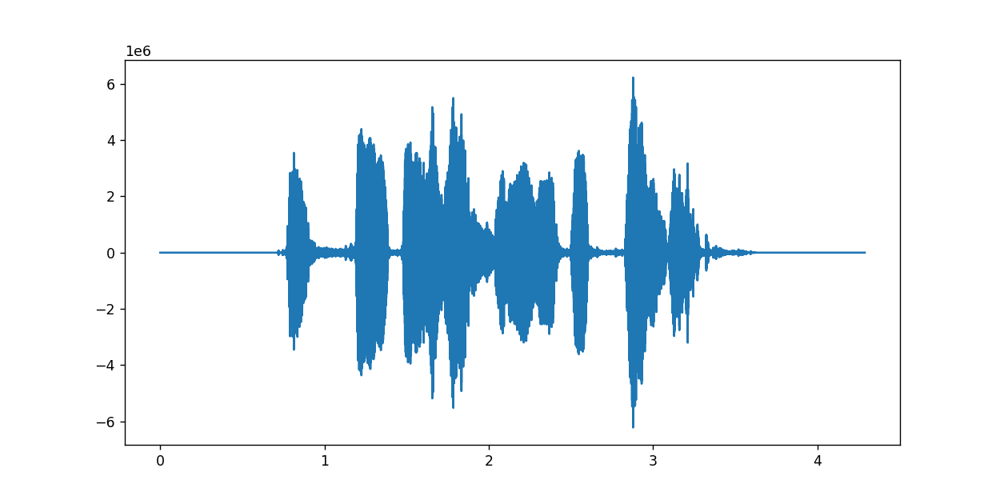

<IPython.core.display.Javascript object>


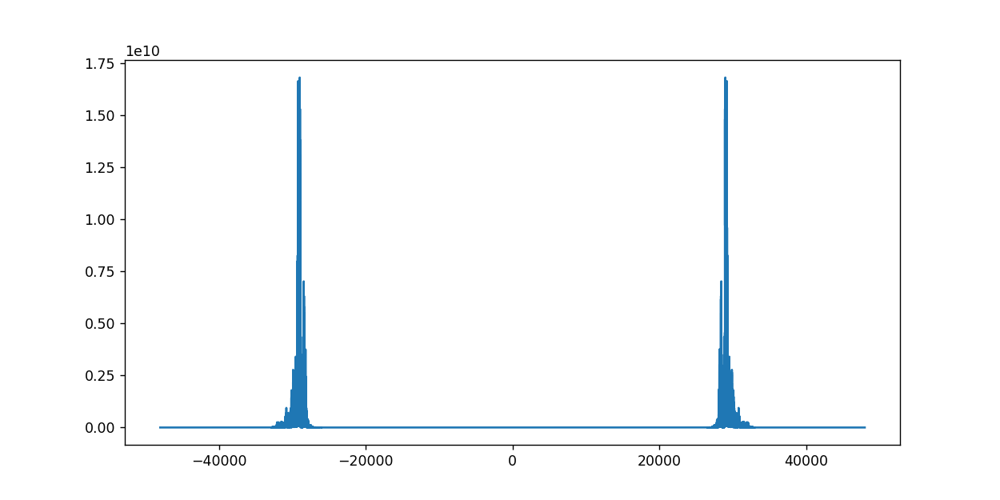

In [8]:
t_tx = np.linspace(0,len(ms)/fs_src,len(ms))
# Step 1: Multiplier 1
m1 = ms * np.cos(2*np.pi*f0*t_tx)
m2 = ms * np.sin(2*np.pi*f0*t_tx)
# Step 2: Lowpass Filter
m3 = sp.lfilter(b_lp, a_lp, m1)
m4 = sp.lfilter(b_lp, a_lp, m2)
# Step 3: Upsampling
mt1 = sp.resample(m3, int(len(ms_src)*fs/fs_src))
mt2 = sp.resample(m4, int(len(ms_src)*fs/fs_src))
# Step 3: Multiplier 2
t_tx = np.linspace(0,len(mt1)/fs,len(mt1))
m5 = mt1 * np.cos(2*np.pi*f1*t_tx)
m6 = mt2 * np.sin(2*np.pi*f1*t_tx)
# Step 4: Add and amplify
mod_out = (m5 + m6) * 2 * 250

# Plotting modulated signal and it's fourier Transform
mod_out_tm = np.linspace(0,len(mod_out)/fs,len(mod_out))
mod_out_fft = np.fft.fftshift(np.fft.fft(mod_out))
mod_out_freq = np.fft.fftshift(np.fft.fftfreq(len(mod_out))*fs)
plt.figure(figsize=([10,5]))
plt.plot(mod_out_tm,mod_out)
plt.figure(figsize=([10,5]))
plt.plot(mod_out_freq,np.abs(mod_out_fft))

Multipath and AWGN Channel 

In [28]:
# Multipath Channel using Acoustic Toolbox
# Surface
surface = np.array([[r, 0.5+0.5*np.sin(2*np.pi*0.005*r)] for r in np.linspace(0,1000,1001)])

# Depth
bathy = [
    [0, 30],    # 30 m water depth at the transmitter
    [300, 25],  # 20 m water depth 300 m away
    [500, 20],  # 20 m water depth at 500 m
    [700, 20], 
    [1000, 25]  
]

# Speed of Sound
ssp = [
    [ 0, 1540],  # 1540 m/s at the surface
    [10, 1530],  # 1530 m/s at 10 m depth
    [20, 1532],  # 1532 m/s at 20 m depth
    [25, 1533],  # 1533 m/s at 25 m depth
    [30, 1535]   # 1535 m/s at the seabed
]

# Other Variables
tx_depth = 10
rx_depth = 15
rx_range = 500

# creating environment
env = pm.create_env2d(
    surface = surface,
    depth = bathy,
    soundspeed = ssp,
    bottom_soundspeed = 1450,
    bottom_density = 1200,
    bottom_absorption = 1.0,
    tx_depth = tx_depth,
    rx_depth = rx_depth,
    rx_range = rx_range    
)   

arrivals = pm.compute_arrivals(env)   # arrival structure at the receiver
rays = pm.compute_eigenrays(env)    # eigenrays between the transmitter and receiver
ir = pm.arrivals_to_impulse_response(arrivals, fs=fs)  # impulse response time series
imp = np.abs(ir)
ch1_out = np.convolve(mod_out, imp)


pm.plot_ssp(env, width=900) # Plotting Speed Profile
pm.plot_rays(rays, env=env, width=900) # Plotting Environment and Eigenrays between between the transmitter and receiver 
pm.plot_arrivals(arrivals, dB = True, width=900)
arlpy_plt.plot(np.abs(ir), fs=fs, width=900) # Plotting Imulse Response

In [24]:
arrivals[['time_of_arrival', 'angle_of_arrival', 'surface_bounces', 'bottom_bounces']]

,time_of_arrival,angle_of_arrival,surface_bounces,bottom_bounces
1,0.331273,-14.409640,2,2
2,0.329859,10.534572,2,1
3,0.327187,-6.721316,0,1
4,0.326810,0.372626,0,0
5,0.326715,-2.167461,0,0
6,0.326818,-4.405950,0,1
7,0.326817,-4.693125,0,1
8,0.328629,8.625628,1,1
9,0.329735,-10.901514,1,2
10,0.333625,14.636025,2,2


In [18]:
env['rx_range'] = np.linspace(0, 1000, 1001)
env['rx_depth'] = np.linspace(0, 30, 301)
tloss = pm.compute_transmission_loss(env)
pm.plot_transmission_loss(tloss, env=env, clim=[-60,-30], width=900)

In [10]:
# AWGN
def AWGN_noise(pts):
    return np.random.normal(0,1,pts)

<IPython.core.display.Javascript object>


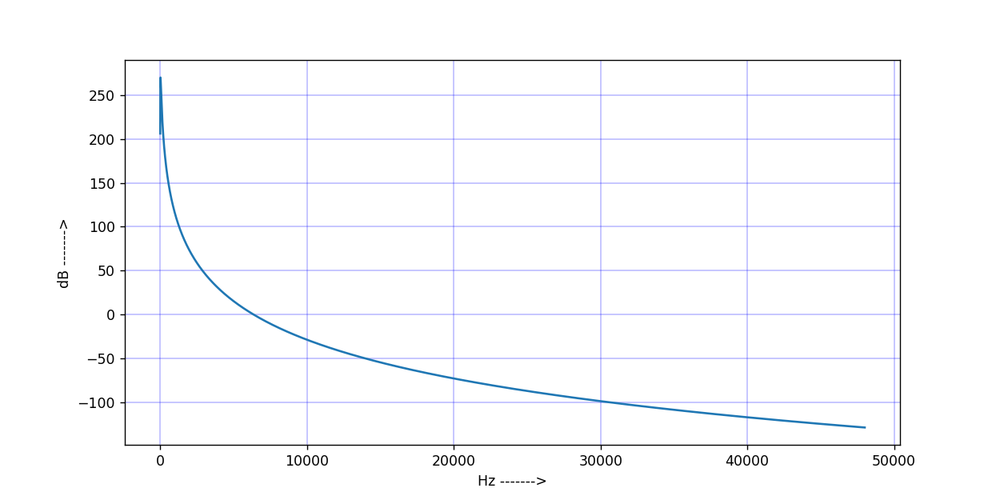

<IPython.core.display.Javascript object>


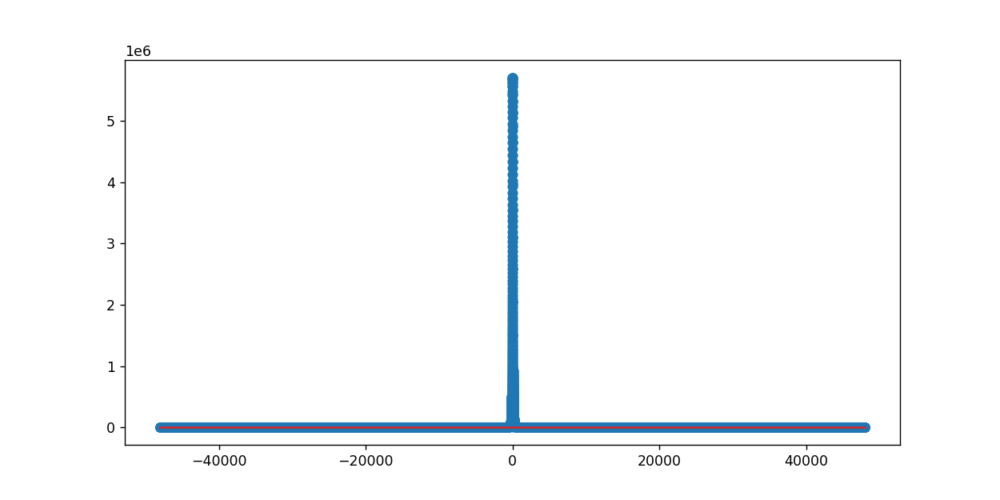

<IPython.core.display.Javascript object>


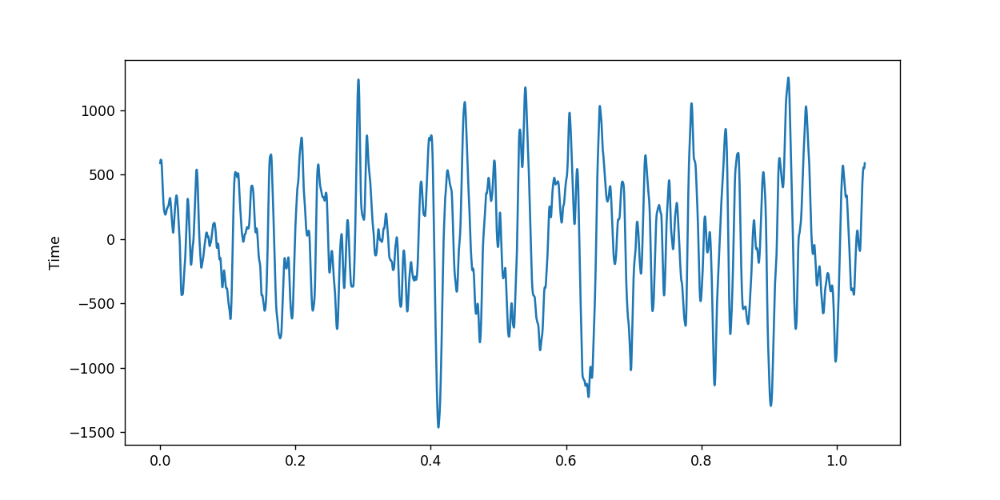

<IPython.core.display.Javascript object>


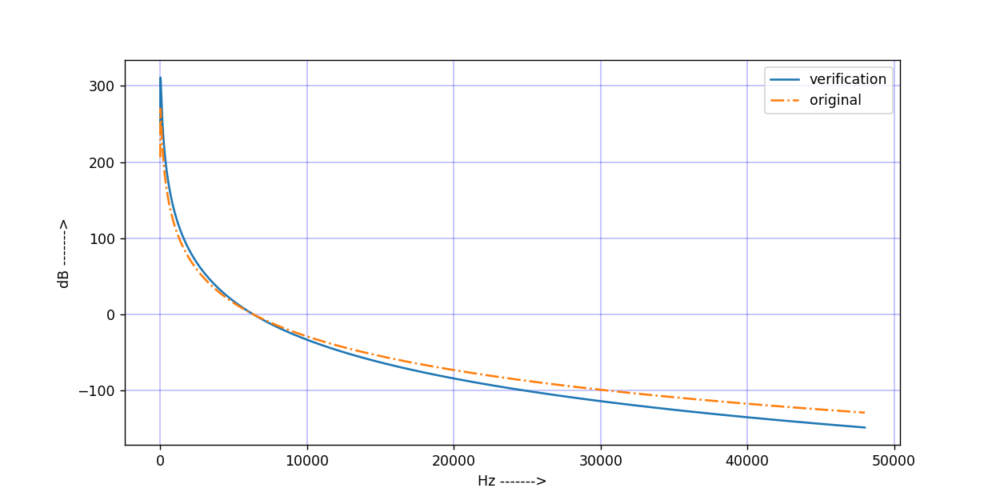

In [11]:
# Noise model
# fs: sampling frequency in Hz
# n : number of points
# w : wind speed
# s : shipping factor 0 to 1
# plt : true to plot the psd and noise
def noise_model(fs, n, w, s, plot): 
    f = np.linspace(1, int(fs/2), int(n/2))/1e3 # divide by 1000 to convert Hz to kHz
    nt = 17 - 30*np.log(f) # turbulence noise
    ns = 40 + 20*(s - 0.5) + 26*np.log(f) - 60*np.log(f+0.03) #ships noise
    nw = 50 + 7.5*(w**0.5) + 20*np.log(f) - 40*np.log(f+0.04) # wind noise
    nth = -15 + 20*np.log(f) # thermal noise
    tot_noise = nt + ns + nw + nth # total noise in db per Hz
    temp = np.power(10,tot_noise/20)
    mag = np.sqrt(temp)
    phase = 2*np.pi*np.random.randn(int(n/2))
    FFT = mag * np.exp(1j*phase)
    if n%2==0:
        FFT = np.append(FFT,np.conj(np.flip(FFT[:len(FFT)-1])))
        FFT = np.append(np.zeros(1),FFT)
    else:
        FFT = np.append(FFT,np.conj(np.flip(FFT)))
        FFT = np.append(np.zeros(1),FFT)
    noise = np.real(np.fft.ifft(FFT))
    ###### verification ############
    a = np.fft.fft(noise)
    b = np.power(np.abs(a),2)
    b = b[1:int(len(b)/2)+1]
    psd = 10*np.log(b)
    #################################
    if plot==True:
        freq = np.linspace(0,fs/2,len(tot_noise))
        plt.figure(figsize=(10,5))
        plt.plot(freq,tot_noise)
        plt.xlabel("Hz ------->"),plt.ylabel("dB ------->")
        plt.grid(color='b', lw = 0.25)
        freq = np.fft.fftfreq(len(FFT))*fs
        plt.figure(figsize=(10,5))
        plt.stem(freq,abs(FFT))
        plt.figure(figsize=(10,5))
        t = np.linspace(0,len(noise)/fs,len(noise))
        plt.plot(t,noise)
        plt.ylabel("Time")
        plt.figure(figsize=(10,5))
        freq = np.linspace(0,fs/2,len(psd))
        plt.plot(freq,psd)
        freq = np.linspace(0,fs/2,len(tot_noise))
        plt.plot(freq,tot_noise, linestyle='-.')
        plt.grid(color='b', lw = 0.25)
        plt.xlabel("Hz ------->"),plt.ylabel("dB ------->")
        plt.legend(["verification", "original"])
    return noise

wind_speed = 5
ship_fac = 1
noise_model(fs, 1e5, wind_speed, ship_fac, True);

<IPython.core.display.Javascript object>


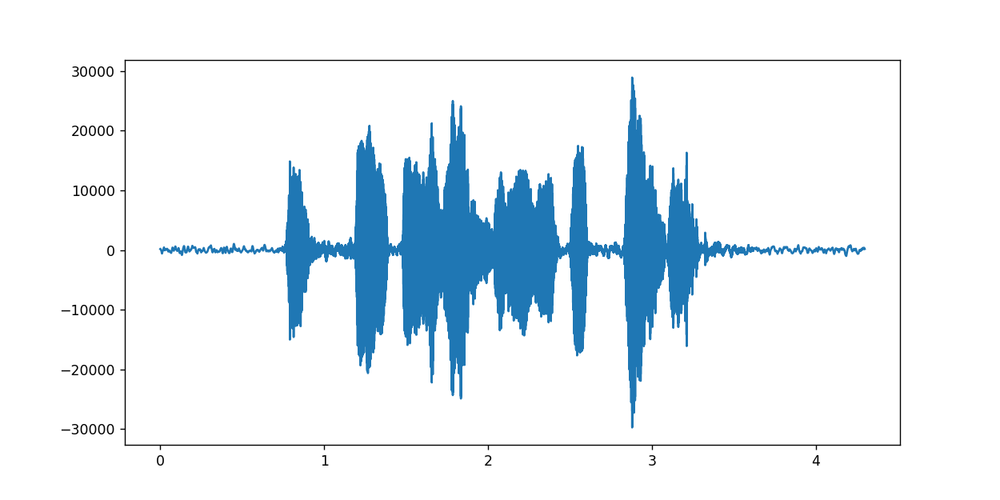

<IPython.core.display.Javascript object>


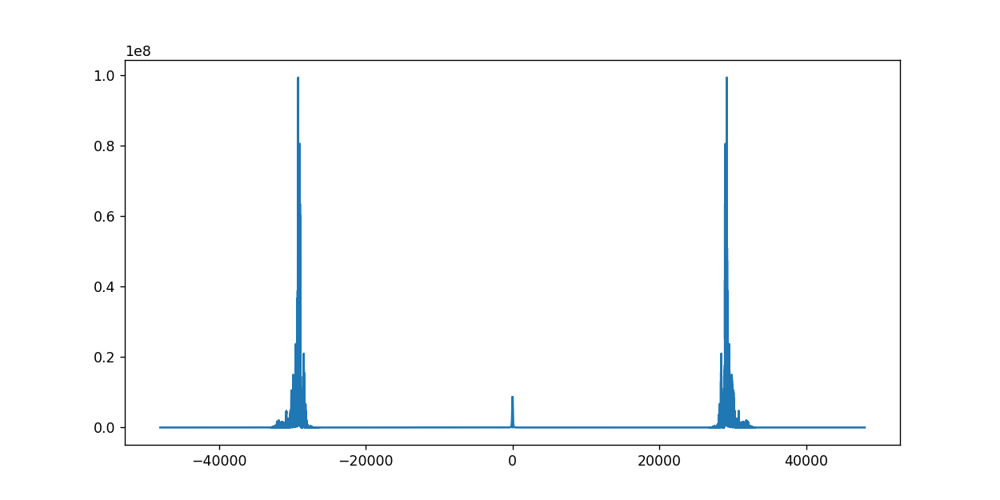

In [12]:
# Passing signal trhough noise channel
add_noise = noise_model(fs, len(ch1_out), wind_speed, ship_fac, False) # using noise model
#add_noise = AWGN_noise(len(ch1_out)) # using AWGN 
SNR = 20 #dB
factor = np.sqrt(np.sum(np.square(ch1_out))/(np.sum(np.square(add_noise))*(10**(SNR/10))))
ch2_out = ch1_out + (add_noise * factor)
ch2_out_tm = np.linspace(0,len(ch2_out)/fs,len(ch2_out))
ch2_out_fft = np.fft.fftshift(np.fft.fft(ch2_out))
ch2_out_freq = np.fft.fftshift(np.fft.fftfreq(len(ch2_out))*fs)
plt.figure(figsize=([10,5]))
plt.plot(ch2_out_tm,ch2_out)
plt.figure(figsize=([10,5]))
plt.plot(ch2_out_freq,np.abs(ch2_out_fft))

Demodulator

<IPython.core.display.Javascript object>


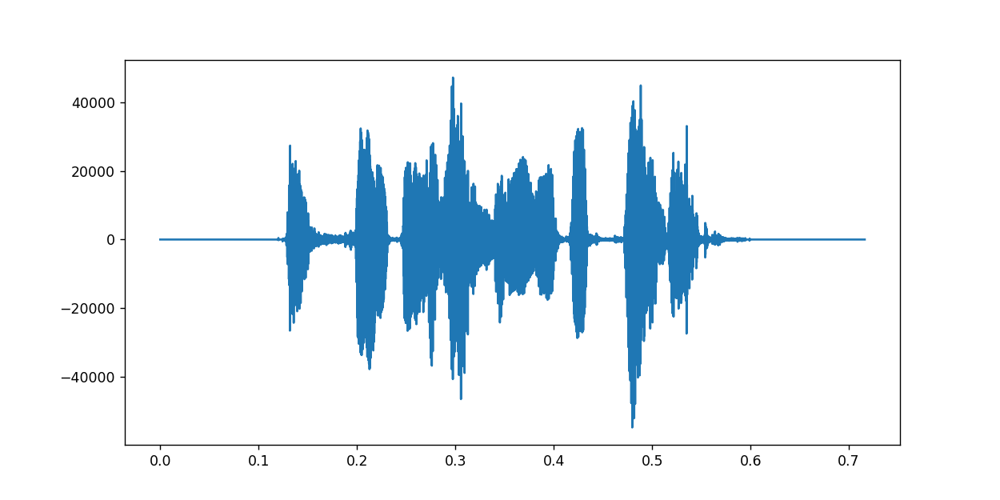

<IPython.core.display.Javascript object>


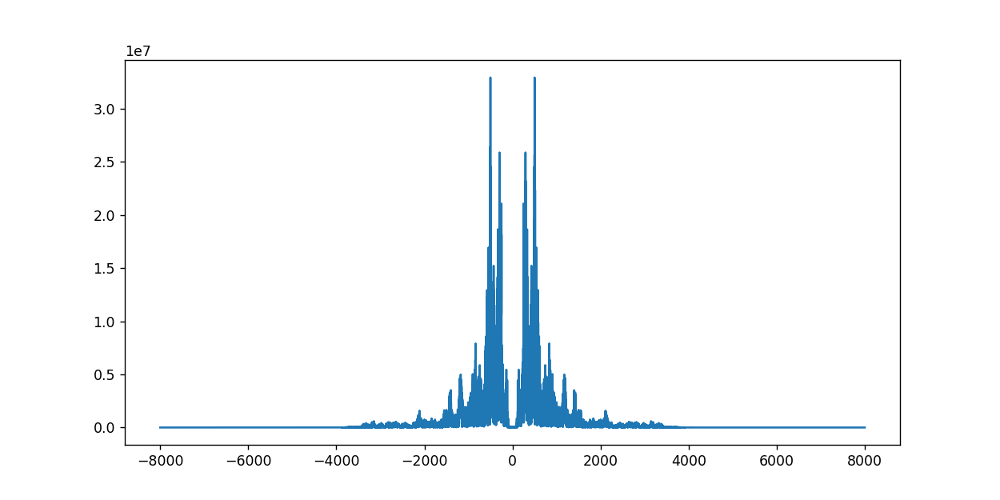

In [13]:
[b_HP, a_HP] = sp.butter(N, 5000, btype='high', analog=False, output='ba', fs = fs)
rx_fil = sp.lfilter(b_HP, a_HP, ch2_out)
t_rx = np.linspace(0,len(rx_fil)/fs,len(rx_fil))
# Step 1: Multiplier 1
m7 = rx_fil * np.cos(2*np.pi*f1*t_rx)
m8 = rx_fil * np.sin(2*np.pi*f1*t_rx)
# step 2: Downsample
mt3 = sp.resample(m7, int(len(m7)*fs_src/fs))
mt4 = sp.resample(m8, int(len(m8)*fs_src/fs))
# Step 2: Lowpass Filter
m9 = sp.lfilter(b_lp, a_lp, mt3)
m10 = sp.lfilter(b_lp, a_lp, mt4)
# Step 3: Multiplier 2
t_rx = np.linspace(0,len(m9)/fs_src,len(m9))
m11 = m9 * np.cos(2*np.pi*f0*t_rx)
m12 = m10 * np.sin(2*np.pi*f0*t_rx)
# Step 4: Add and amplify
demod_out = (m11 + m12) * 2 *2

# Plotting modulated signal and it's fourier Transform
demod_out_tm = np.linspace(0,len(demod_out)/fs,len(demod_out))
demod_out_fft = np.fft.fftshift(np.fft.fft(demod_out))
demod_out_freq = np.fft.fftshift(np.fft.fftfreq(len(demod_out))*fs_src)
plt.figure(figsize=([10,5]))
plt.plot(demod_out_tm,demod_out)
plt.figure(figsize=([10,5]))
plt.plot(demod_out_freq,np.abs(demod_out_fft))

Saving Audio to wav file

In [15]:
dest_audio = "d:\\UWA Project\\demod_out_20db.wav"
wav.write(dest_audio, fs_src, demod_out.astype('int16'))